In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

## 1 Gaussian Filter with different kernel size

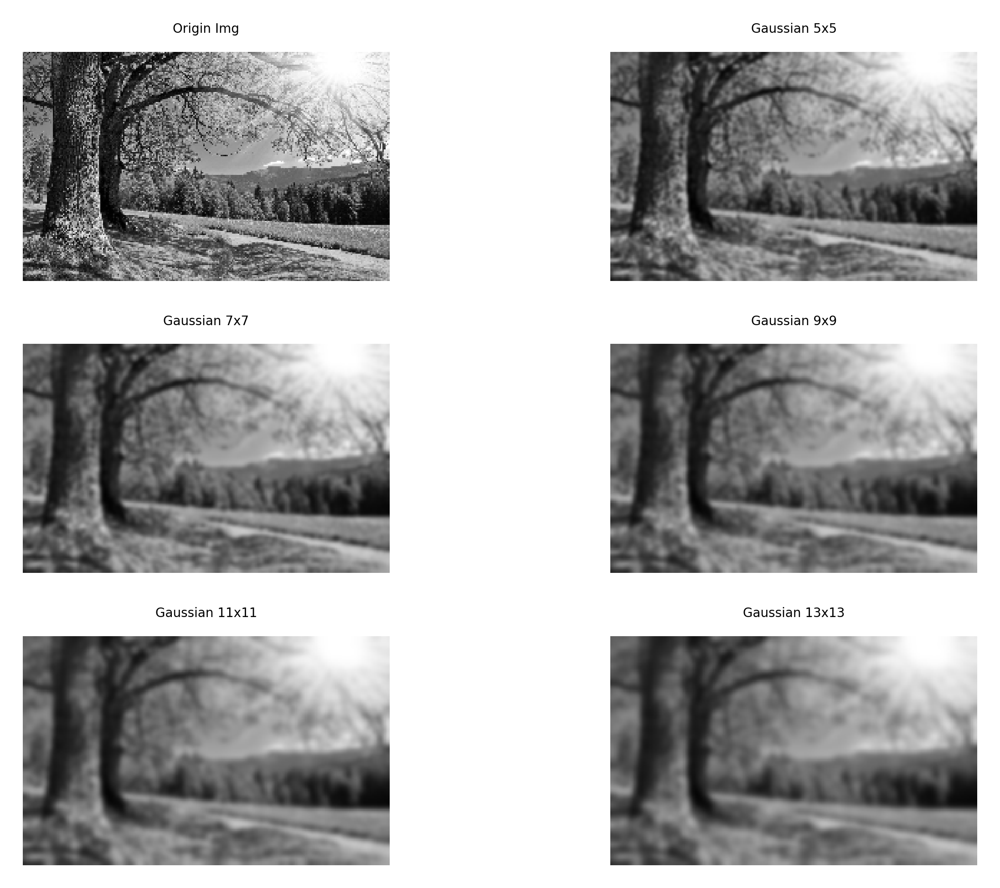

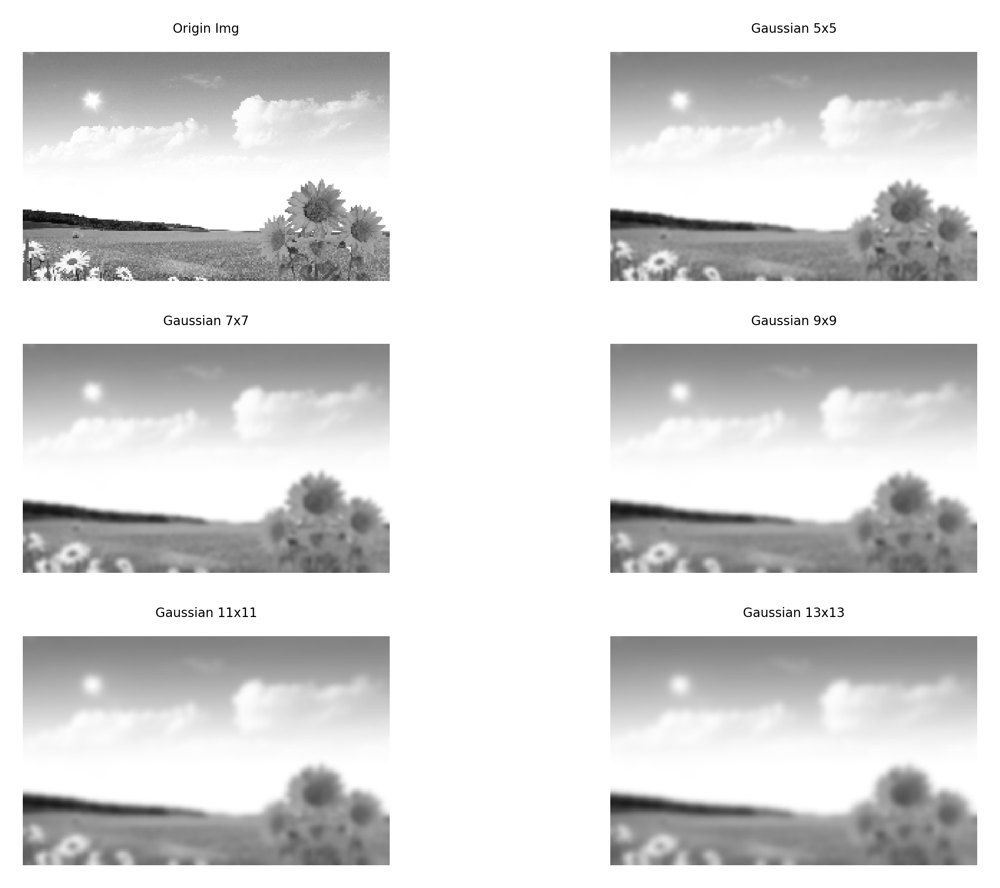

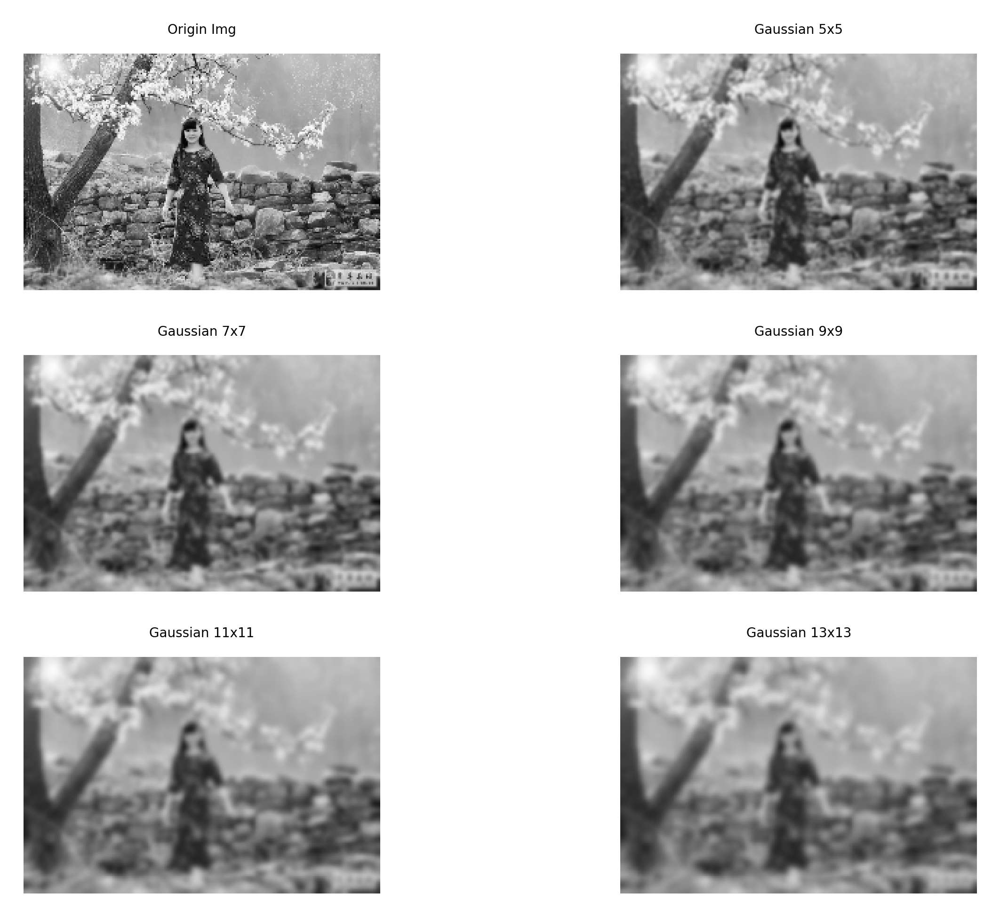

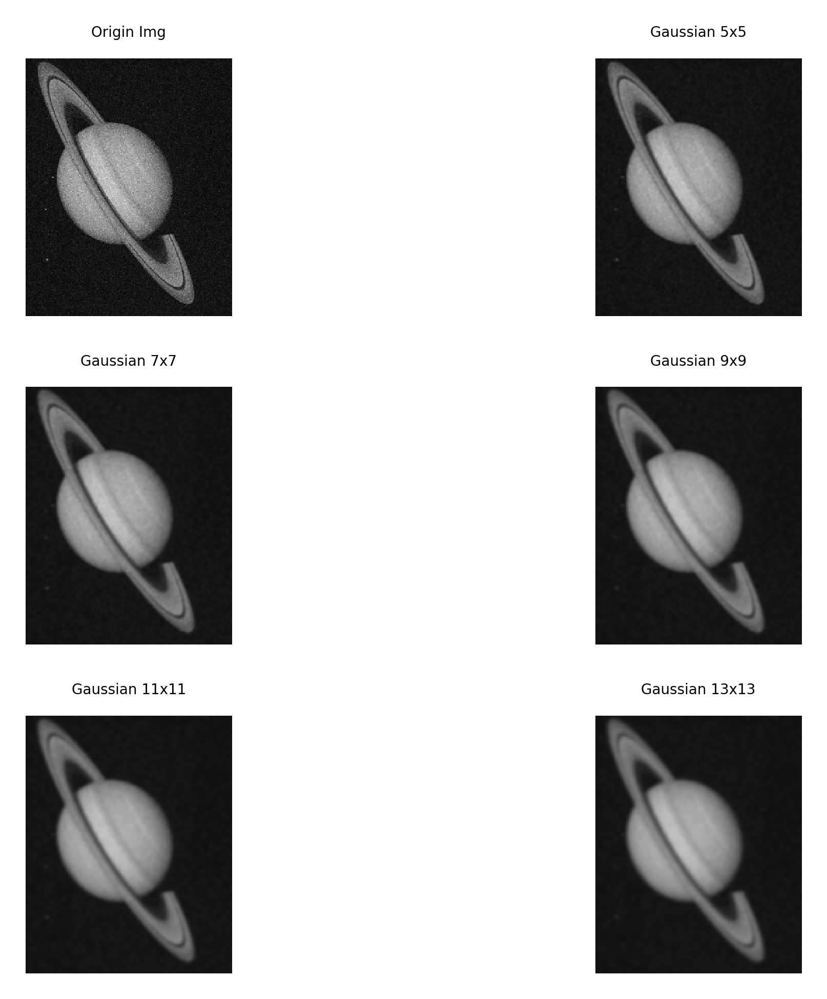

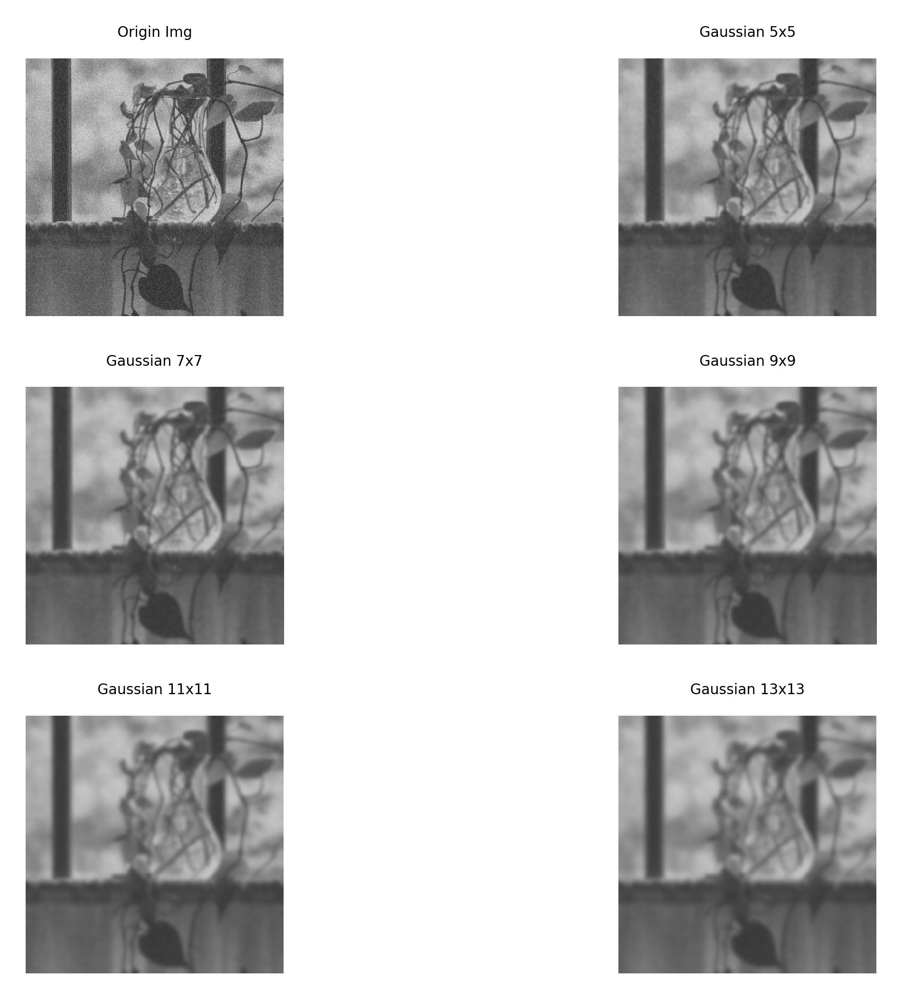

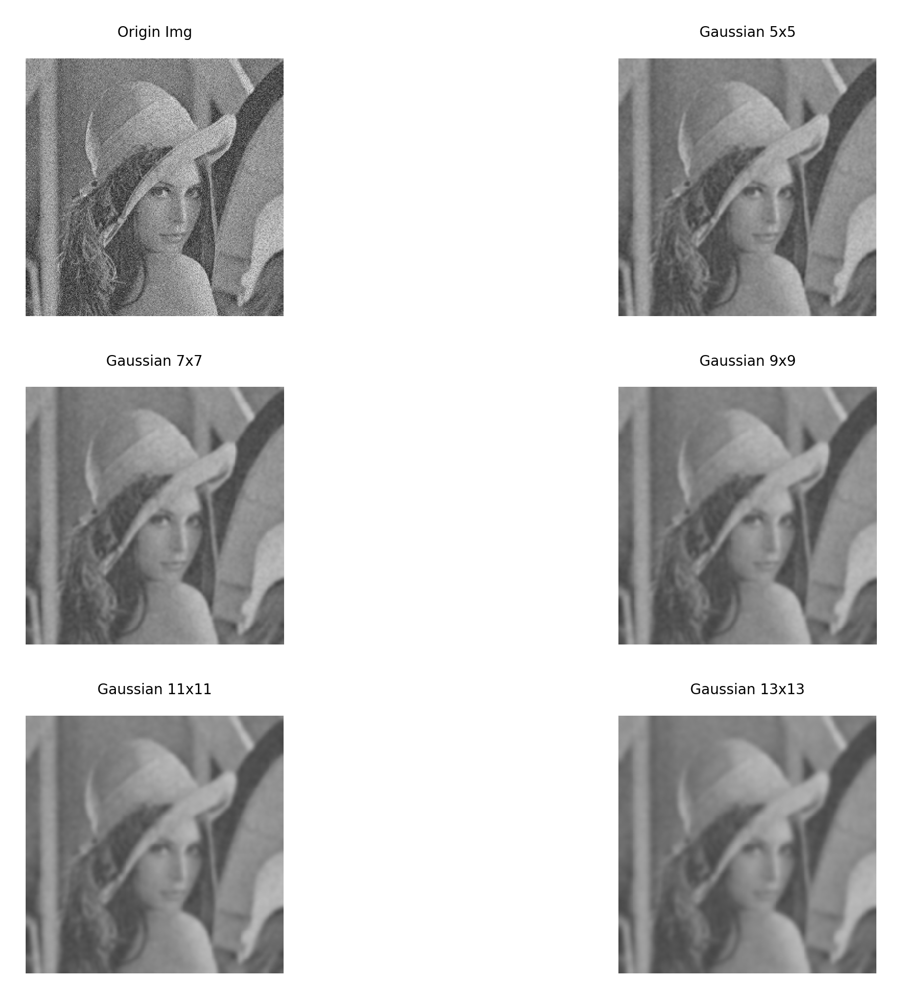

In [12]:
# ksize = [5, 13, 19, 23, 29]
ksize = [5, 7, 9, 11, 13]
# img = cv2.imread("3.jpg")

for img_name in os.listdir('gaussian'):
    img_dir = os.path.join('gaussian', img_name)
    img = cv2.imread(img_dir)
    height, width, _ = img.shape
    scale_p = 256 / width
    img = cv2.resize(img, None, fx=scale_p, fy=scale_p)
    plt.figure(dpi=500)
    plt.subplot(3, 2, 1)
    plt.axis('off')
    plt.imshow(img, cmap='gray')
    plt.title('Origin Img', fontsize='4')
    for i, k in enumerate(ksize, 2):
        gaussian_img = cv2.GaussianBlur(img, (k, k), 0)
        # plt.subplots(figsize=(25,25))
        plt.subplot(3, 2, i)
        plt.axis('off')
        plt.imshow(gaussian_img, cmap='gray')
        plt.title('Gaussian ' + str(k) + 'x' + str(k), fontsize='4')
    plt.tight_layout()
    plt.show()
    # plt.savefig('gaussian/'+'blur_'+img_name+'.jpg')

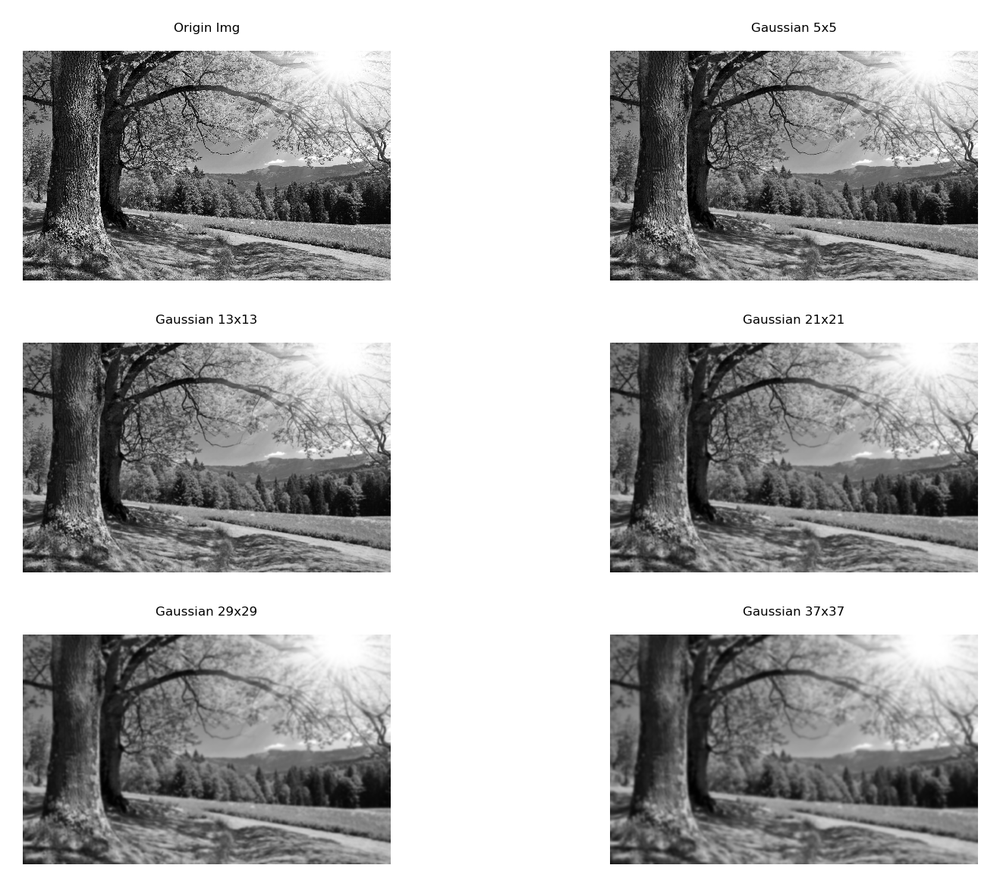

In [9]:
img = cv2.imread("1.jpg")
height, width, _ = img.shape
scale_p = 256 / width
simg = cv2.resize(img, None, fx=scale_p, fy=scale_p)
# cv2.imshow('img', simg)
# cv2.waitKey(0)
ksize = [5, 13, 21, 29, 37]
plt.figure(dpi=300)
plt.subplot(3, 2, 1)
plt.axis('off')
plt.imshow(img, cmap='gray')
plt.title('Origin Img', fontsize='4')
for i, k in enumerate(ksize, 2):
    gaussian_img = cv2.GaussianBlur(img, (k, k), 0)
    # plt.subplots(figsize=(25,25))
    plt.subplot(3, 2, i)
    plt.axis('off')
    plt.imshow(gaussian_img, cmap='gray')
    plt.title('Gaussian ' + str(k) + 'x' + str(k), fontsize='4')
plt.tight_layout()
plt.show()

## 2 Threshold Segmentation
Compare Wang's threshold segmentation with OSTU 

In [27]:

# Wang's boundary point threshold segmentation
def wang_seg(img):
    laplace = cv2.Laplacian(img, -1, ksize=3)
    grad_x = cv2.Sobel(img, -1, 1, 0)
    grad_y = cv2.Sobel(img, -1, 0, 1)
    gradx = cv2.convertScaleAbs(grad_x)
    grady = cv2.convertScaleAbs(grad_y)
    gradient = np.sqrt(gradx**2+grady**2)

    flag1 = (laplace <= 0)
    flag2 = (gradient >= 5)
    boundary = flag1 & flag2
    
    threshold = np.sum(img * boundary) / np.sum(boundary) / 1.15
    ret, seg = cv2.threshold(img, threshold, 255, cv2.THRESH_BINARY)
    return ret, seg


threshold_seg\6.jpg


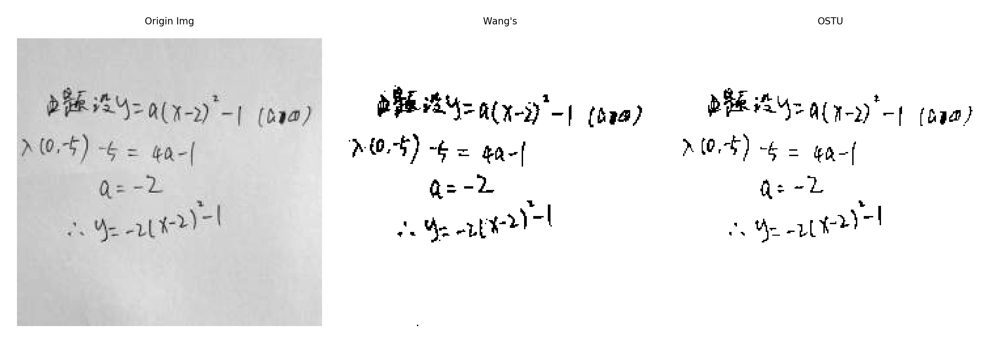

In [28]:
for img_name in os.listdir('threshold_seg'):
    
    img_dir = os.path.join('threshold_seg', img_name)
    print(img_dir)
    img = cv2.imread(img_dir)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt.figure(dpi=500)
    plt.subplot(1, 3, 1)
    plt.axis('off')
    plt.imshow(img, cmap='gray')
    plt.title('Origin Img', fontsize='4')
    # wang's seg
    ret1, seg1 = wang_seg(img)
    # ostu
    ret2, seg2 = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    plt.subplot(1, 3, 2)
    plt.axis('off')
    plt.imshow(seg1, cmap='gray')
    plt.title("Wang's", fontsize='4')
    plt.subplot(1, 3, 3)
    plt.axis('off')
    plt.imshow(seg2, cmap='gray')
    plt.title("OSTU", fontsize='4')
    plt.tight_layout()
    plt.savefig('threshold_seg/'+'seg_'+img_name+'.jpg')
        

## 3 edge detection
Test different operators, Robert, Prewitt, Sobel, Laplacian, Gaussian+Laplacian, Canny

In [13]:
# Roberts Operator
def Robert(img):
    kernelx = np.array([[-1, 0], [0, 1]], dtype=int)
    kernely = np.array([[0, -1], [1, 0]], dtype=int)

    x = cv2.filter2D(img, cv2.CV_16S, kernelx)
    y = cv2.filter2D(img, cv2.CV_16S, kernely)

    absX = cv2.convertScaleAbs(x)
    absY = cv2.convertScaleAbs(y)
    grad = cv2.addWeighted(absX, 0.5, absY, 0.5, 0)
    return grad

In [14]:
# Prewitt Operator
def Prewitt(img):
    kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]],dtype=int)
    kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]],dtype=int)

    x = cv2.filter2D(img, cv2.CV_16S, kernelx)
    y = cv2.filter2D(img, cv2.CV_16S, kernely)

    absX = cv2.convertScaleAbs(x)
    absY = cv2.convertScaleAbs(y)
    grad = cv2.addWeighted(absX, 0.5, absY, 0.5, 0)
    return grad

In [15]:
# Sobel Operator
def Sobels(img):
    x = cv2.Sobel(img, cv2.CV_16S, 1, 0)
    y = cv2.Sobel(img, cv2.CV_16S, 0, 1)

    absX = cv2.convertScaleAbs(x)
    absY = cv2.convertScaleAbs(y)
    grad = cv2.addWeighted(absX, 0.5, absY, 0.5, 0)
    return grad

In [16]:
def Laplacian(img):
    dst = cv2.Laplacian(img, cv2.CV_16S, ksize=3)
    Laplacian = cv2.convertScaleAbs(dst)
    return Laplacian


In [17]:
def GaussianLaplacian(img, sigmaX, sigmaY):
    img = cv2.GaussianBlur(img, (3, 3), sigmaX, sigmaY)
    dst = cv2.Laplacian(img, cv2.CV_16S, ksize=3)
    GLaplacian = cv2.convertScaleAbs(dst)
    return GLaplacian

In [ ]:
titles = ['Source Image', 'Roberts Image','Prewitt Image',
           'Sobel Image', 'Laplacian Image', 'Gaussian Laplacian Image']
for img_name in os.listdir('edge_detection'):
   img_dir = os.path.join('edge_detection', img_name)
   img = cv2.imread(img_dir)
   images = [img, Robert(img), Prewitt(img), Sobels(img), Laplacian(img), GaussianLaplacian(img, 0, 0)]
   plt.figure(dpi=400)
   for i in range(6):
      plt.subplot(2, 3, i+1), plt.imshow(images[i], cmap='gray')
      plt.title(titles[i], fontsize='6')
      plt.xticks([]), plt.yticks([])
   plt.tight_layout()
   name = img_name.split('.')[0]
   plt.savefig('edge_detection/edged_'+name+'.png')

In [18]:
# Canny Operator
# 1. Smooth the input image with a Gaussian filter.
# 2. Compute the gradient magnitude and angle images.
# 3. Apply nonmaxima suppression to the gradient magnitude image.
# 4. Use double thresholding and connectivity analysis to detect and link edges.
# img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
def NMS(img):
    w, h= img.shape
    print(w, h)
    for i in range(2, w):
        for j in range(2, h):
            if img[i,j] < np.max(img[i-1:i+1, j-1:j+1]):
                img[i,j] = 0
    return img


512 512


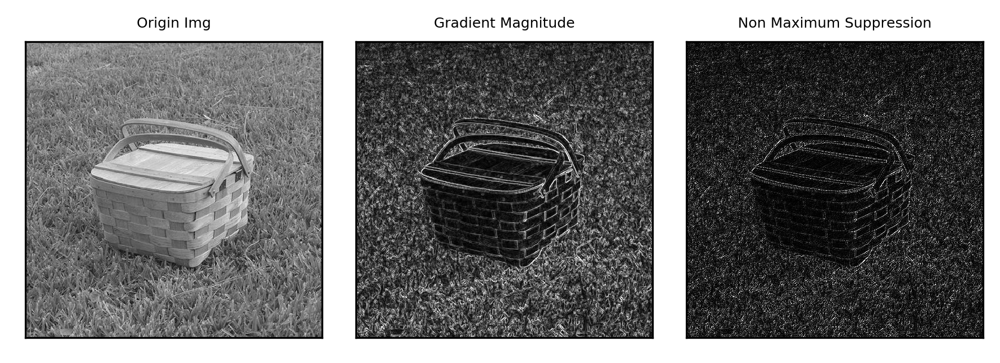

512 512


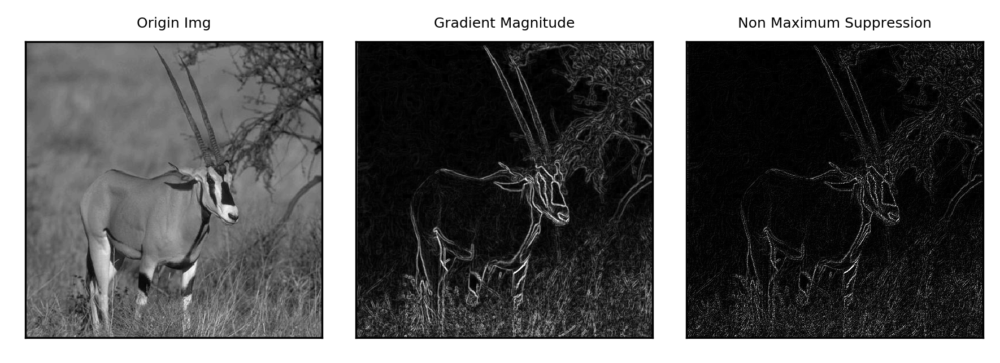

238 353


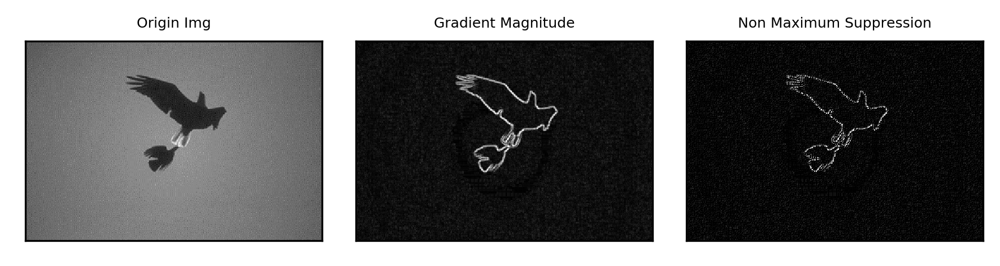

194 253


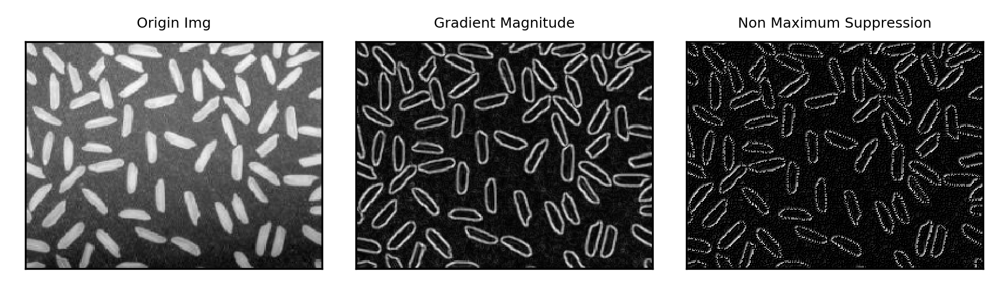

In [19]:
# Observation of NMS effect
folder_dir = 'edge_detection'
imgs_name = ['complex1.jpg', 'complex2.jpg', 'simple1.bmp', 'simple2.bmp']
titles = ['Origin Img', 'Gradient Magnitude', 'Non Maximum Suppression']
for img_name in imgs_name:
    img_dir = os.path.join(folder_dir, img_name)
    img = cv2.imread(img_dir)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt.figure(dpi=300)
    plt.subplot(1, 3, 1), plt.imshow(img, cmap='gray')
    plt.title(titles[0], fontsize='6')
    plt.xticks([]), plt.yticks([])
    sobel = Sobels(img)
    plt.subplot(1, 3, 2), plt.imshow(sobel, cmap='gray')
    plt.title(titles[1], fontsize='6')
    plt.xticks([]), plt.yticks([])
    nms = NMS(sobel)
    plt.subplot(1, 3, 3), plt.imshow(nms, cmap='gray')
    plt.title(titles[2], fontsize='6')
    plt.xticks([]), plt.yticks([])
        
    plt.tight_layout()
    plt.show()
    



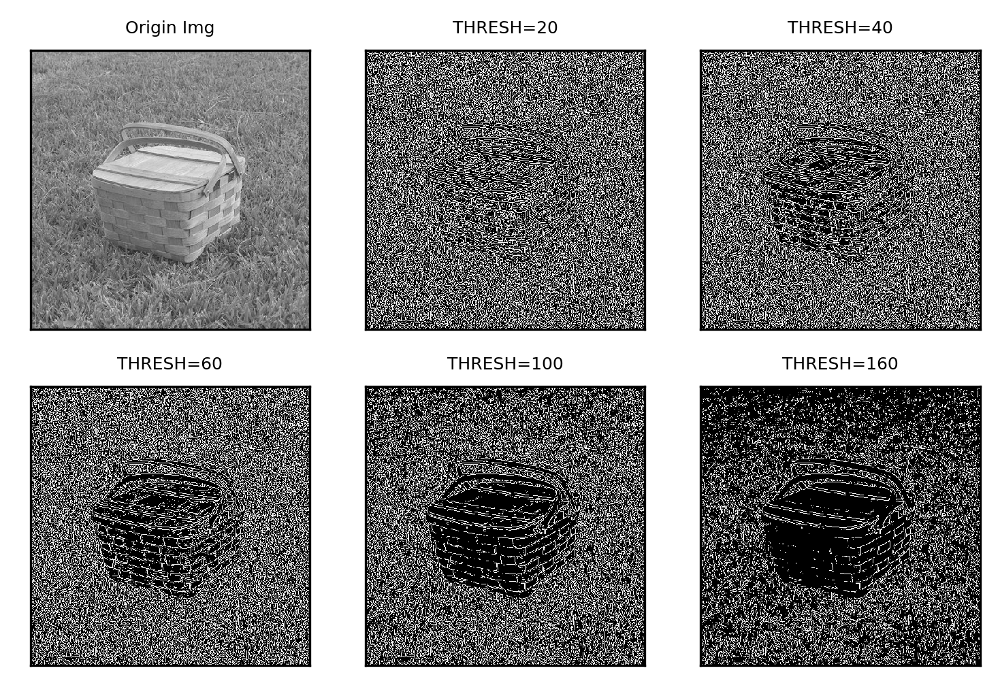

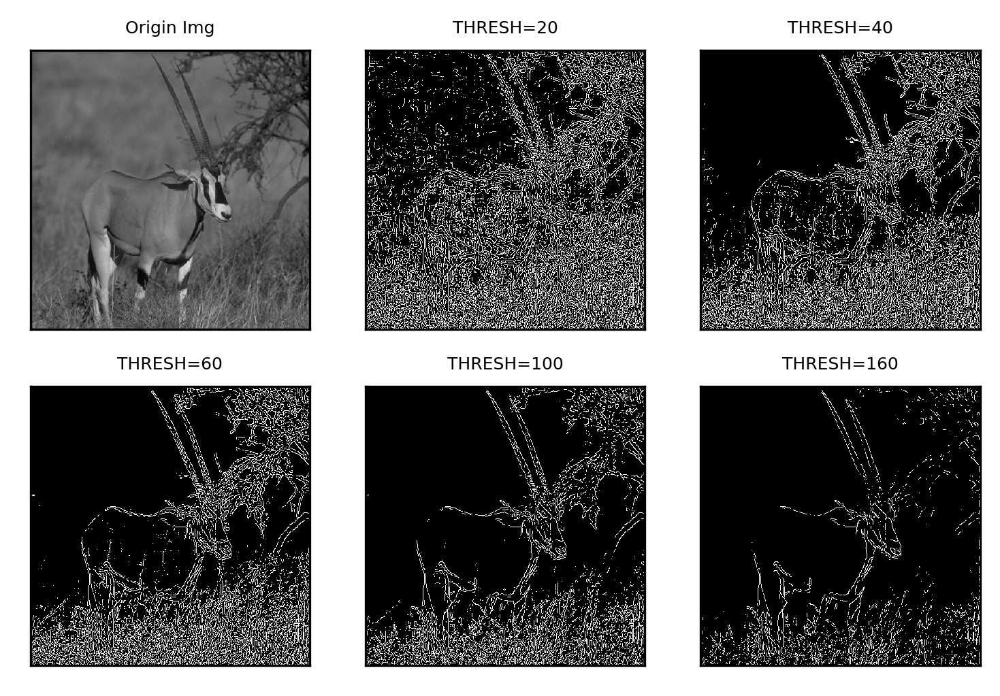

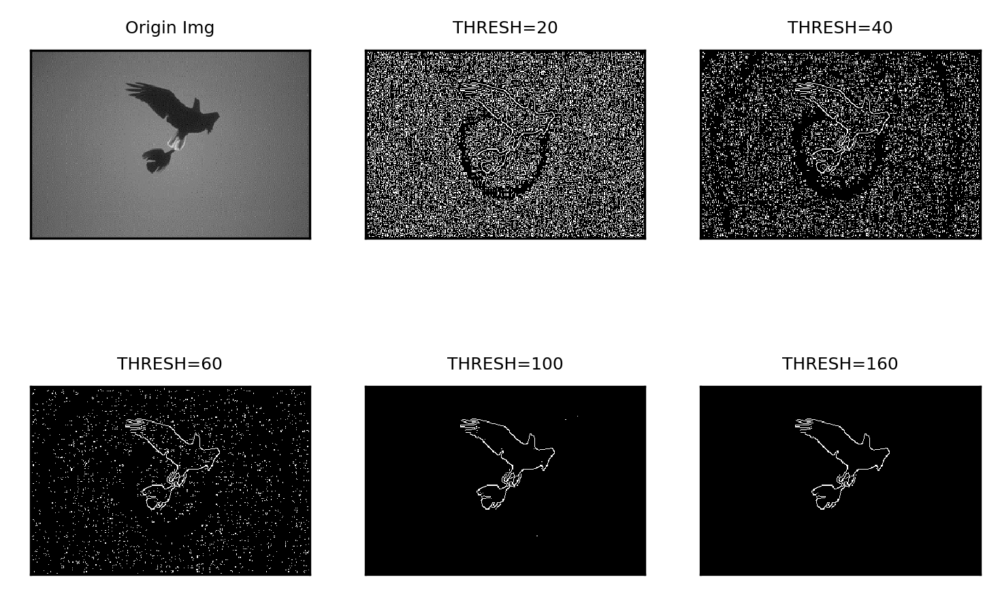

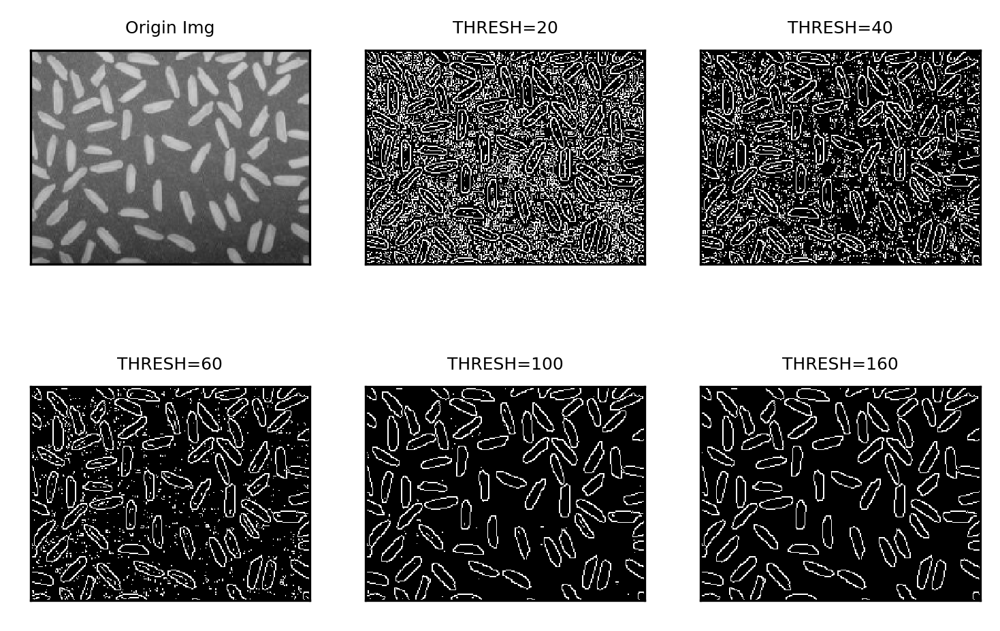

In [20]:
# one threshold 
THRESH = [20, 40, 60, 100, 160]
thresh = ['THRESH='+str(THRESH[i]) for i in range(len(THRESH))]
titles = ['Origin Img'] + thresh
folder_dir = 'edge_detection'
imgs_name = ['complex1.jpg', 'complex2.jpg', 'simple1.bmp', 'simple2.bmp']

for img_name in imgs_name:
    img_dir = os.path.join(folder_dir, img_name)
    img = cv2.imread(img_dir)
    plt.figure(dpi=300)
    plt.subplot(2, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title(titles[0], fontsize='6')
    plt.xticks([]), plt.yticks([])
    for i in range(len(THRESH)):
        canny = cv2.Canny(img, THRESH[i], THRESH[i])
        plt.subplot(2, 3, i+2)
        plt.imshow(canny, cmap='gray')
        plt.title(titles[i+1], fontsize='6')
        plt.xticks([]), plt.yticks([])
    plt.show()
    

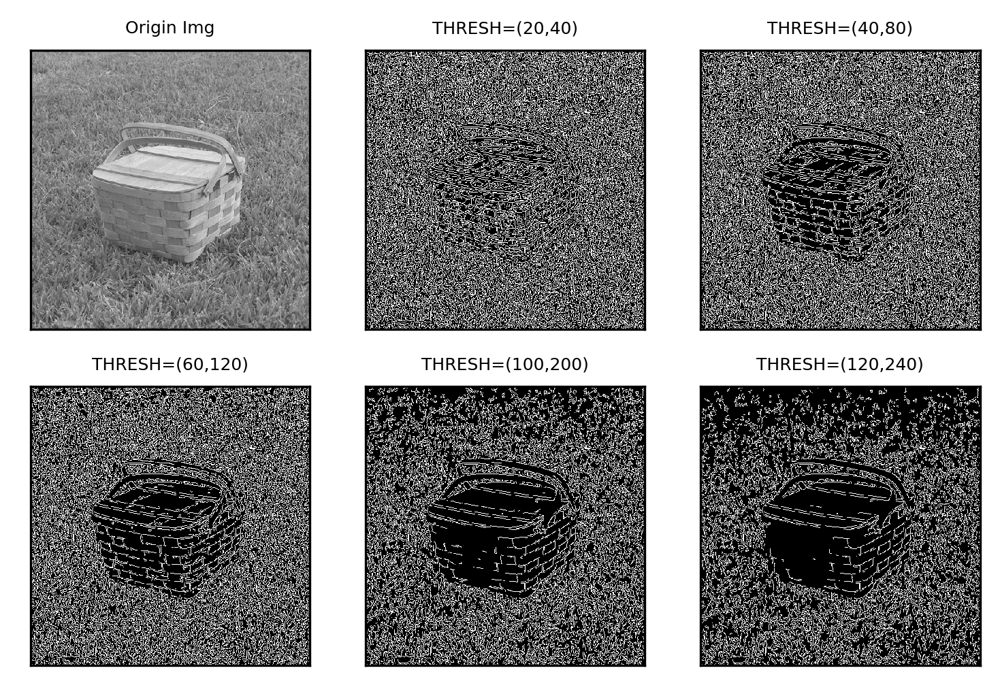

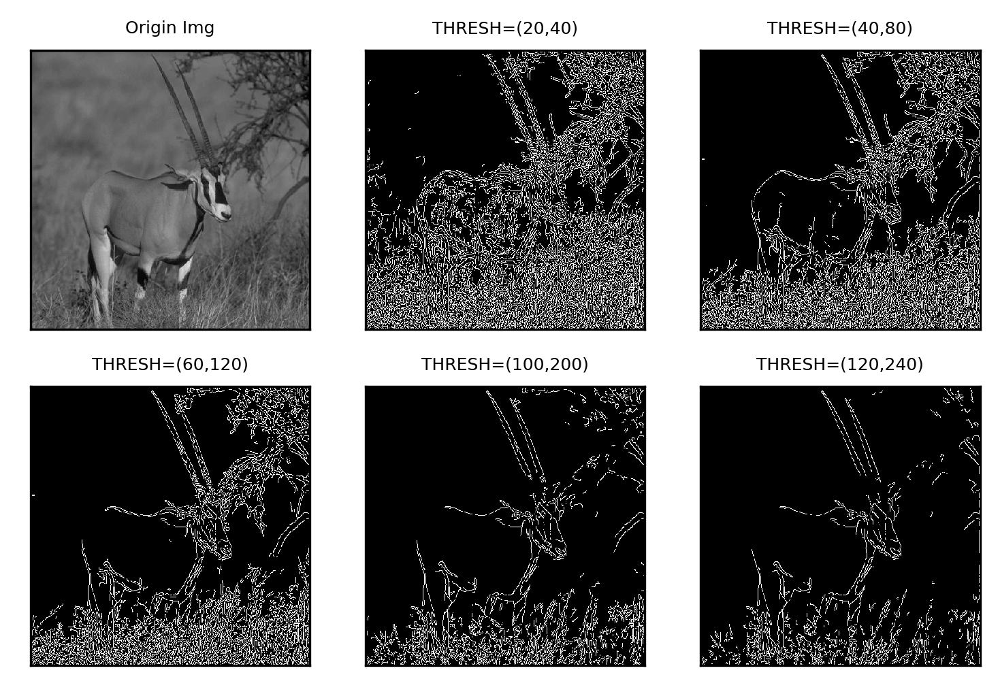

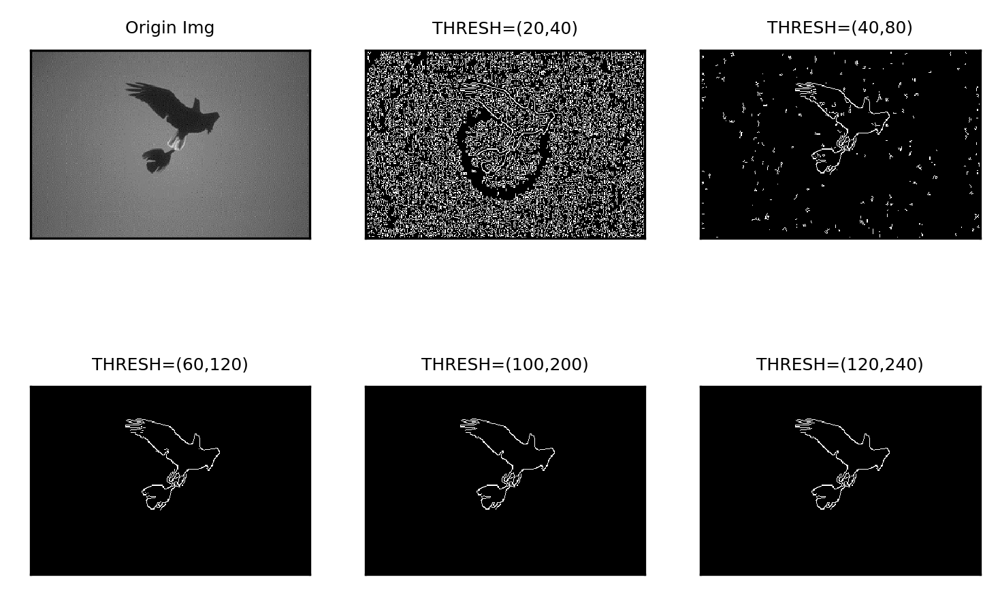

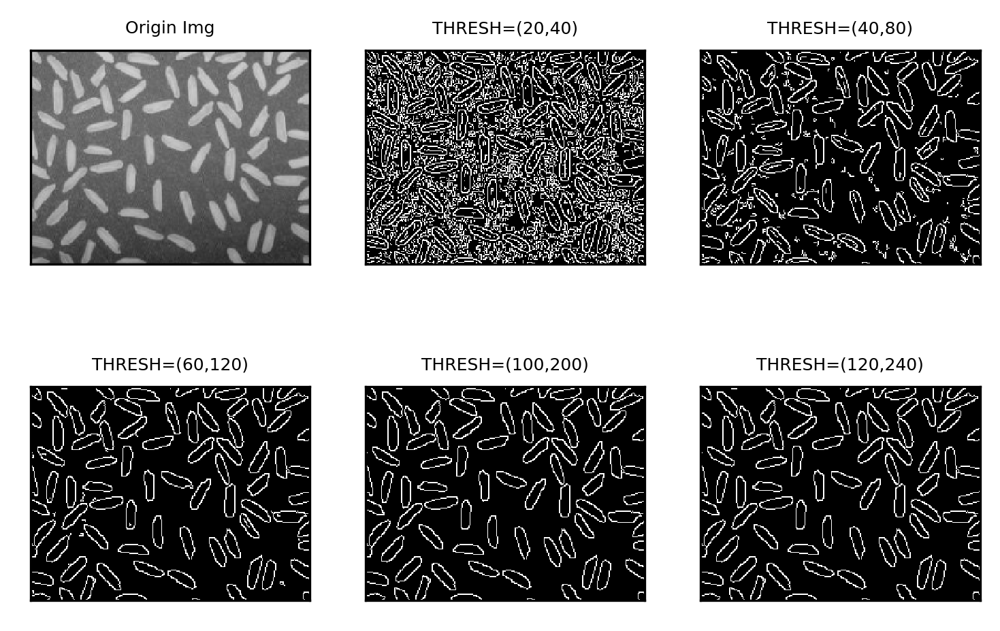

In [30]:
# Two Threshold
THRESH = [(20, 40), (40,80), (60, 120), (100, 200), (120, 240)]
thresh = ['THRESH=('+str(THRESH[i][0])+','+str(THRESH[i][1])+')' for i in range(len(THRESH))]
titles = ['Origin Img'] + thresh
folder_dir = 'edge_detection'
imgs_name = ['complex1.jpg', 'complex2.jpg', 'simple1.bmp', 'simple2.bmp']

for img_name in imgs_name:
    img_dir = os.path.join(folder_dir, img_name)
    img = cv2.imread(img_dir)
    plt.figure(dpi=300)
    plt.subplot(2, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title(titles[0], fontsize='6')
    plt.xticks([]), plt.yticks([])
    for i in range(len(THRESH)):
        canny = cv2.Canny(img, THRESH[i][0], THRESH[i][1])
        plt.subplot(2, 3, i+2)
        plt.imshow(canny, cmap='gray')
        plt.title(titles[i+1], fontsize='6')
        plt.xticks([]), plt.yticks([])
    plt.show()

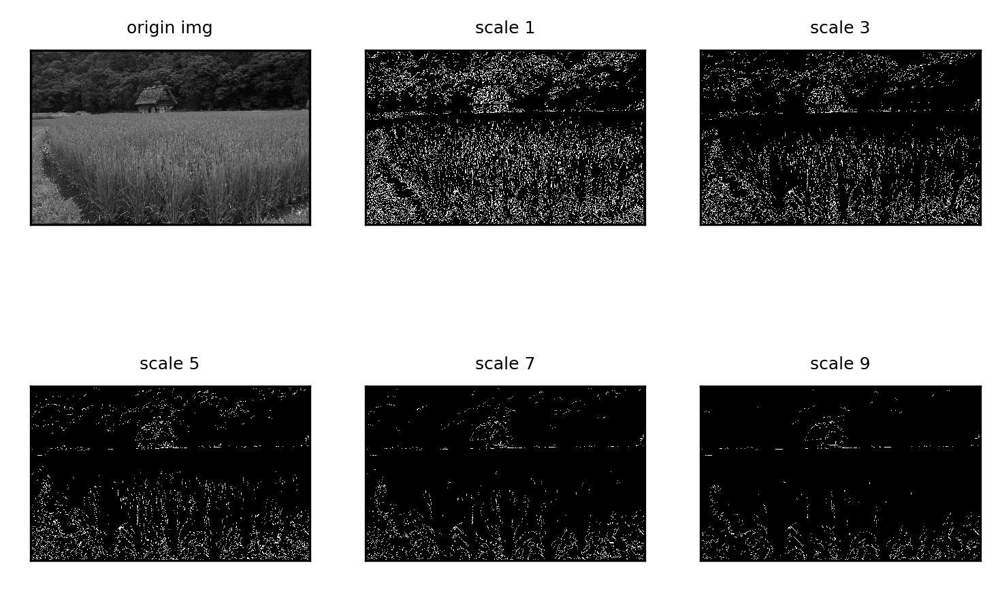

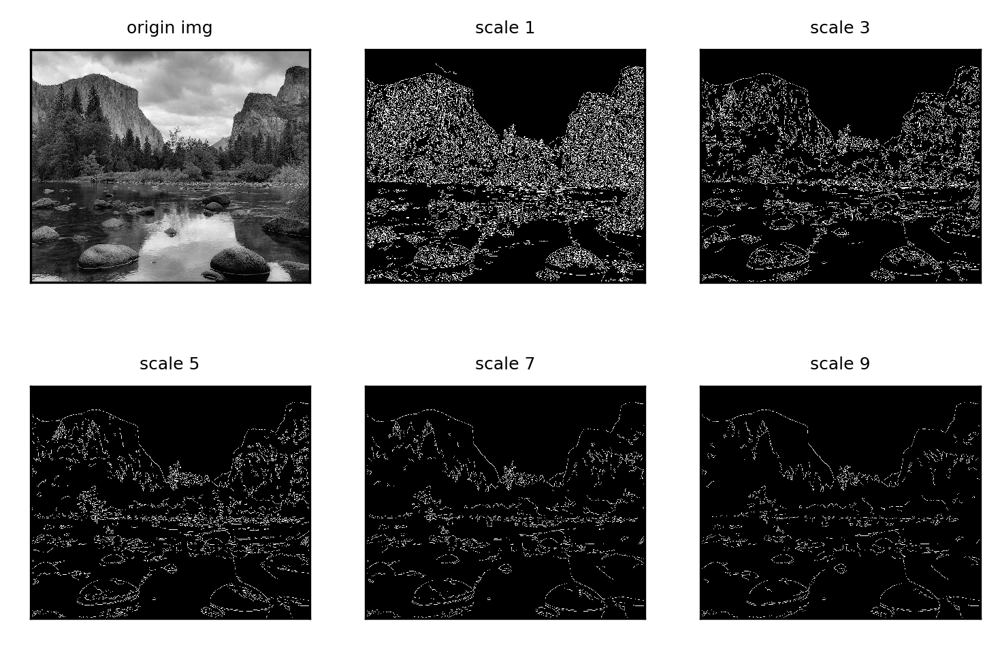

In [4]:
# Multi scale
scale_x = [1, 3, 5, 7, 9]
img_dirs = ['edge_detection/multiscale2.jpg', 'edge_detection/multiscale3.jpg']
titles = ['origin img', 'scale 1', 'scale 3', 'scale 5', 'scale 7', 'scale 9']
for img_dir in img_dirs:
    img = cv2.imread(img_dir)
    plt.figure(dpi=300)
    plt.subplot(2, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title(titles[0], fontsize='6')
    plt.xticks([]), plt.yticks([])
    for i in range(len(scale_x)):
        img = cv2.GaussianBlur(img, (3,3), sigmaX=scale_x[i])
        canny = cv2.Canny(img, 50, 120)
        plt.subplot(2, 3, i+2)
        plt.imshow(canny, cmap='gray')
        plt.title(titles[i+1], fontsize='6')
        plt.xticks([]), plt.yticks([])
    plt.show()


## 4 Area Growth

512 512


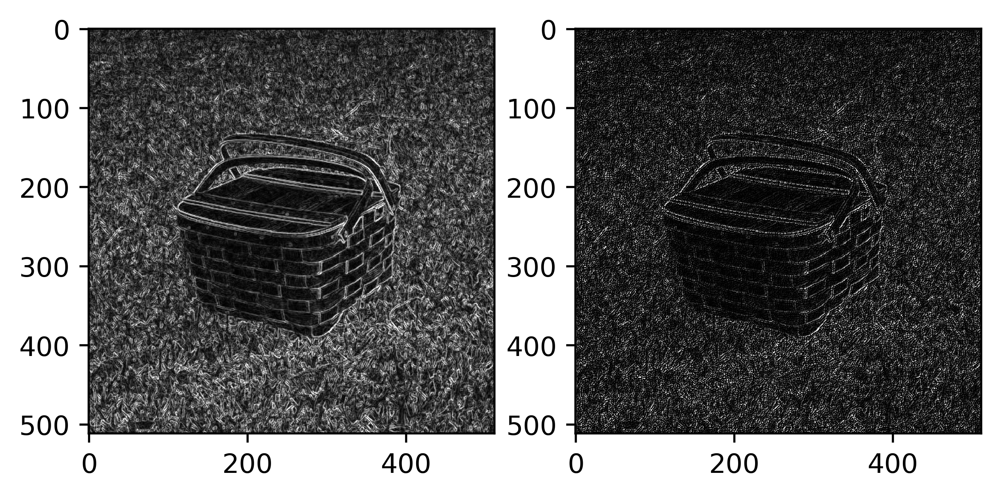

In [16]:
a = np.arange(4).reshape(2,2)
np.max(a)
img.shape
can_img = cv2.Canny(img, 260, 260)
plt.figure(dpi=500)
plt.subplot(121)
plt.imshow(Sobels(img), cmap='gray')
plt.subplot(122)
plt.imshow(NMS(Sobels(img)), cmap='gray')

In [6]:
import numpy as np
import cv2
 
class Point(object):
    def __init__(self,x,y):
        self.x = x
        self.y = y
 
    def getX(self):
        return self.x
    def getY(self):
        return self.y
 
def getGrayDiff(img,currentPoint,tmpPoint):
    return abs(int(img[currentPoint.x,currentPoint.y]) - int(img[tmpPoint.x,tmpPoint.y]))
 
def selectConnects(p):
    if p != 0:
        connects = [Point(-1, -1), Point(0, -1), Point(1, -1), Point(1, 0), Point(1, 1), \
                    Point(0, 1), Point(-1, 1), Point(-1, 0)]
    else:
        connects = [ Point(0, -1),  Point(1, 0),Point(0, 1), Point(-1, 0)]
    return connects
 
def regionGrow(img,seeds,thresh,p = 1):
    height, weight = img.shape
    seedMark = np.zeros(img.shape)
    seedList = []
    for seed in seeds:
        seedList.append(seed)
    label = 1
    connects = selectConnects(p)
    while(len(seedList)>0):
        currentPoint = seedList.pop(0)
 
        seedMark[currentPoint.x,currentPoint.y] = label
        for i in range(8):
            tmpX = currentPoint.x + connects[i].x
            tmpY = currentPoint.y + connects[i].y
            if tmpX < 0 or tmpY < 0 or tmpX >= height or tmpY >= weight:
                continue
            grayDiff = getGrayDiff(img,currentPoint,Point(tmpX,tmpY))
            if grayDiff < thresh and seedMark[tmpX,tmpY] == 0:
                seedMark[tmpX,tmpY] = label
                seedList.append(Point(tmpX,tmpY))
    return seedMark



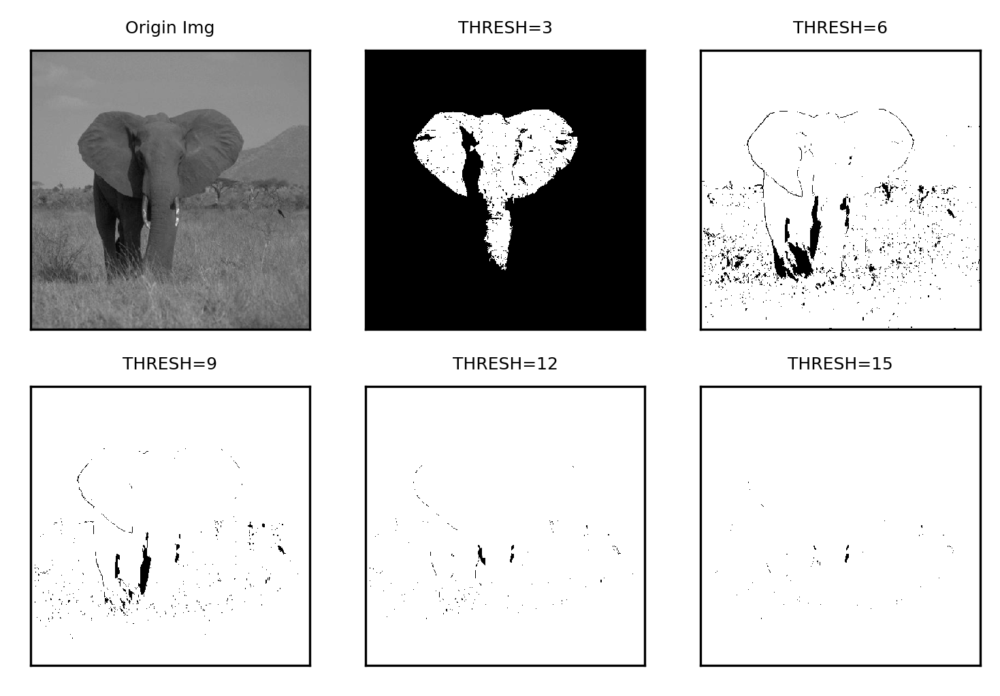

In [13]:
#　Different T influence
img = cv2.imread('regingrowth/complex1.jpg',0)
# seeds = [Point(120,180), Point(120, 220), Point(120, 100), Point(220, 100)]
seeds = [Point(200,300)]
THRESH = [3, 6, 9, 12, 15]
titles = ['Origin Img', 'THRESH=3', 'THRESH=6', 'THRESH=9', 'THRESH=12', 'THRESH=15']

plt.figure(dpi=300)
plt.subplot(2, 3, 1)
plt.imshow(img, cmap='gray')
plt.title(titles[0], fontsize='6')
plt.xticks([]), plt.yticks([])
for i in range(len(THRESH)):
    binaryImg = regionGrow(img,seeds,THRESH[i])
    plt.subplot(2, 3, i+2)
    plt.imshow(binaryImg, cmap='gray')
    plt.title(titles[i+1], fontsize='6')
    plt.xticks([]), plt.yticks([])
plt.show()

(([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

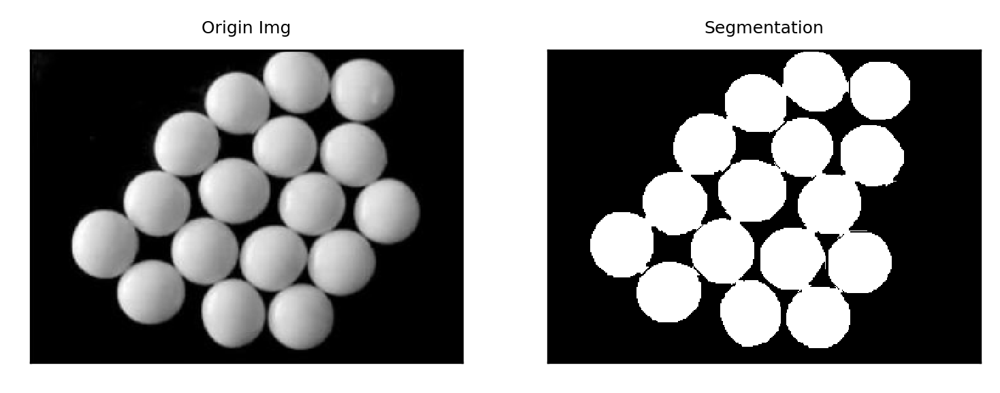

In [18]:
img_dirs = ['regingrowth/simple1.bmp', 'regingrowth/simple2.jpg', 'regingrowth/simple3.jpg', \
            'regingrowth/complex1.jpg', 'regingrowth/complex2.jpg', 'regingrowth/complex3.jpg']
plt.figure(dpi=300)
seeds = [Point(120,180), Point(120, 220), Point(120, 100), Point(220, 100), Point(220, 170), Point(40, 260)]

plt.subplot(1, 2, 1)
img = cv2.imread(img_dirs[0], 0)
plt.imshow(img, cmap='gray')
plt.title('Origin Img', fontsize='6')
plt.xticks([]), plt.yticks([])
binaryImg = regionGrow(img,seeds,10)
plt.subplot(1, 2, 2)
plt.imshow(binaryImg, cmap='gray')
plt.title('Segmentation', fontsize='6')
plt.xticks([]), plt.yticks([])
    
    

(([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

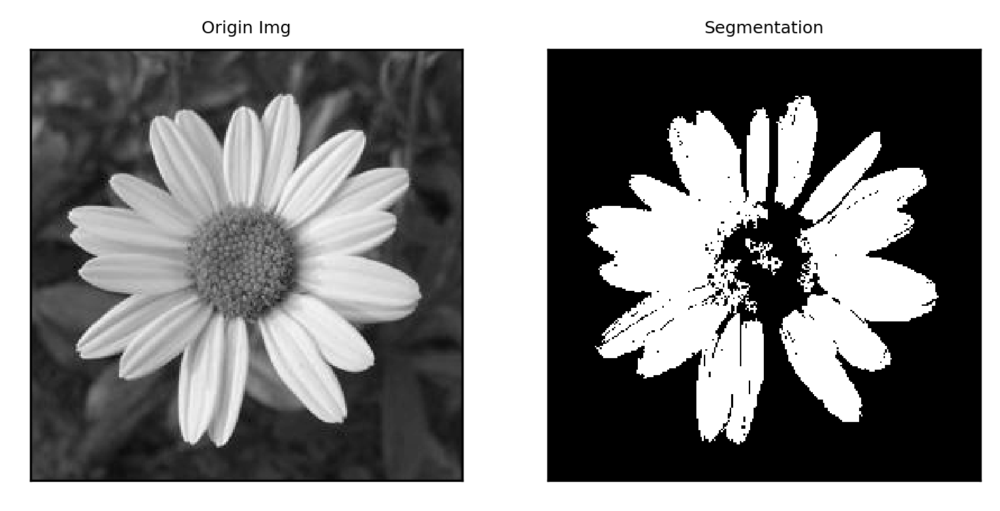

In [19]:
plt.figure(dpi=300)
plt.subplot(1, 2, 1)
img = cv2.imread(img_dirs[2], 0)
seeds = [Point(125, 200), Point(125, 50), Point(60, 120), Point(60, 135), Point(80, 160), Point(180, 110), Point(175, 175), Point(175, 150), Point(125, 125), Point(150, 120), Point(100, 120)]
plt.imshow(img, cmap='gray')
plt.title('Origin Img', fontsize='6')
plt.xticks([]), plt.yticks([])
binaryImg = regionGrow(img,seeds,8)
plt.subplot(1, 2, 2)
plt.imshow(binaryImg, cmap='gray')
plt.title('Segmentation', fontsize='6')
plt.xticks([]), plt.yticks([])
# seeds = [Point(125, 125), Point(150, 120), Point(100, 120)]
# binaryImg = regionGrow(img,seeds,7)
# plt.subplot(1, 3, 3)
# plt.imshow(binaryImg, cmap='gray')
# plt.tight_layout()


(([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

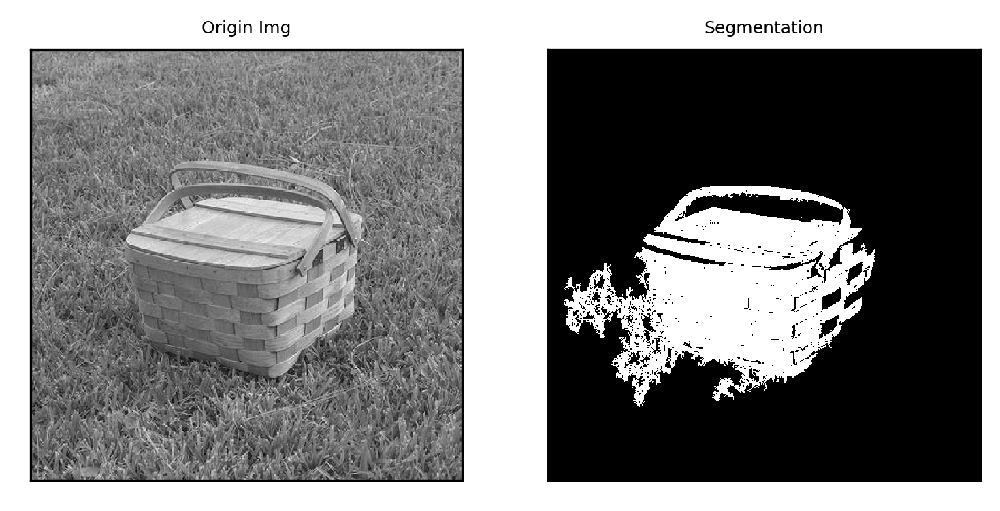

In [29]:
plt.figure(dpi=300)
plt.subplot(1, 2, 1)
img = cv2.imread(img_dirs[5], 0)
seeds = [Point(300, 300), Point(200, 300), Point(300, 200), Point(230, 230)]
plt.imshow(img, cmap='gray')
plt.title('Origin Img', fontsize='6')
plt.xticks([]), plt.yticks([])
binaryImg = regionGrow(img,seeds,9)
plt.subplot(1, 2, 2)
plt.imshow(binaryImg, cmap='gray')
plt.title('Segmentation', fontsize='6')
plt.xticks([]), plt.yticks([])
# seeds = [Point(125, 125), Point(150, 120), Point(100, 120)]


In [ ]:
# split and merge
plt.figure(dpi=300)
plt.subplot(1, 2, 1)
img = cv2.imread(img_dirs[3], 0)
seeds = [Point(200, 200)]
plt.imshow(img, cmap='gray')
plt.title('Origin Img', fontsize='6')
plt.xticks([]), plt.yticks([])
binaryImg = regionGrow(img,seeds,4)
plt.subplot(1, 2, 2)
plt.imshow(binaryImg, cmap='gray')
plt.title('Segmentation', fontsize='6')
plt.xticks([]), plt.yticks([])

In [30]:
# Split and Merge

#判断方框是否需要再次拆分为四个
def judge(w0, h0, w, h):
    a = img[h0: h0 + h, w0: w0 + w]
    ave = np.mean(a)
    std = np.std(a, ddof=1)
    count = 0
    total = 0
    for i in range(w0, w0 + w):
        for j in range(h0, h0 + h):
        #注意！我输入的图片数灰度图，所以直接用的img[j,i]，RGB图像的话每个img像素是一个三维向量，不能直接与avg进行比较大小。
            if abs(img[j, i] - ave) < 1 * std:
                count += 1
            total += 1
    if (count / total) < 0.95:#合适的点还是比较少，接着拆
        return True
    else:
        return False

##将图像将根据阈值二值化处理，在此默认125
def draw(w0, h0, w, h):
    for i in range(w0, w0 + w):
        for j in range(h0, h0 + h):
            if img[j, i] > 125:
                img[j, i] = 255
            else:
                img[j, i] = 0


def function(w0, h0, w, h):
    if judge(w0, h0, w, h) and (min(w, h) > 5):
        function(w0, h0, int(w / 2), int(h / 2))
        function(w0 + int(w / 2), h0, int(w / 2), int(h / 2))
        function(w0, h0 + int(h / 2), int(w / 2), int(h / 2))
        function(w0 + int(w / 2), h0 + int(h / 2), int(w / 2), int(h / 2))
    else:
        draw(w0, h0, w, h)




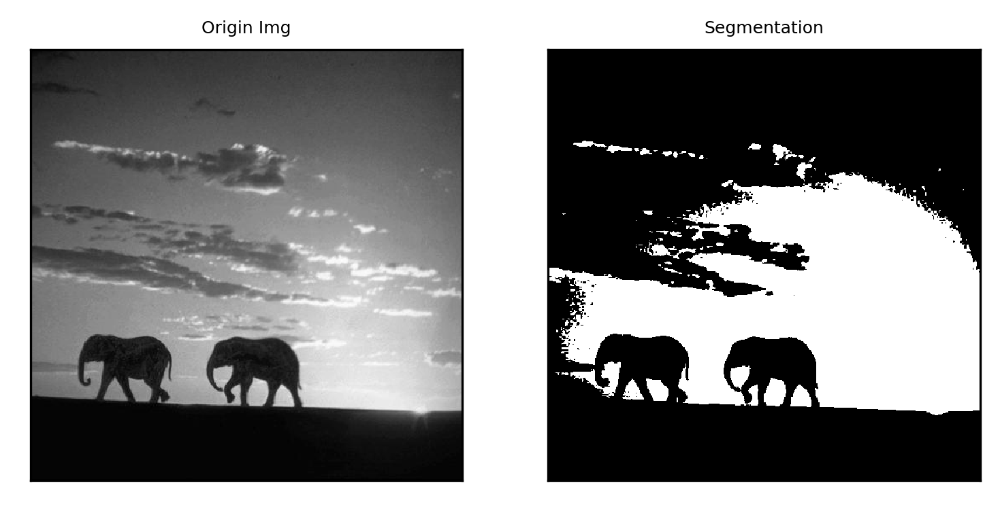

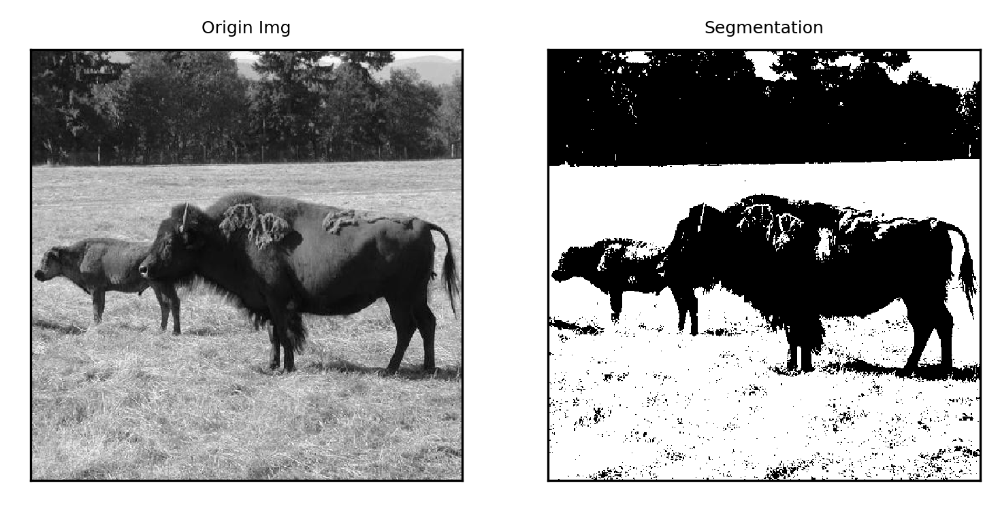

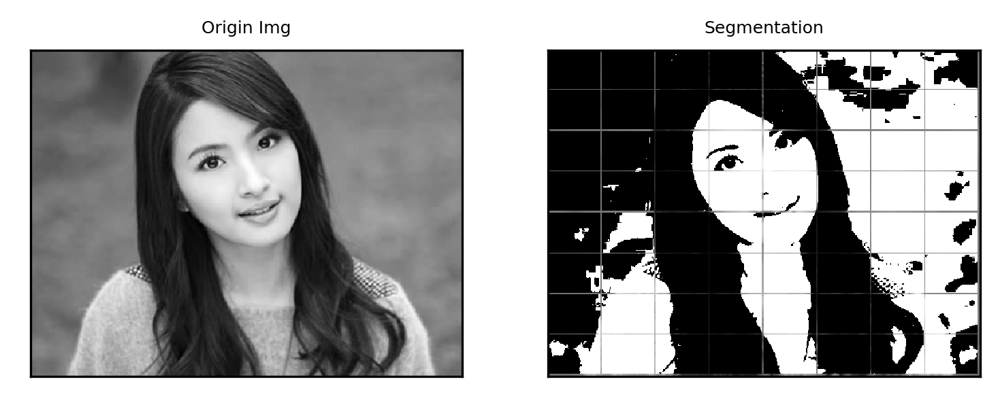

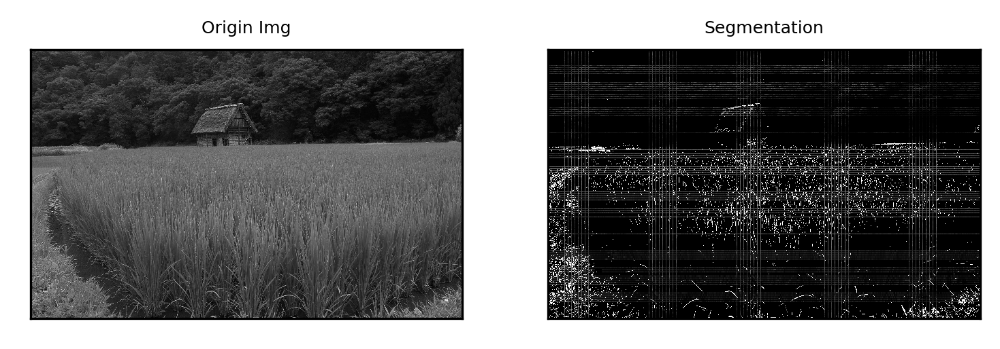

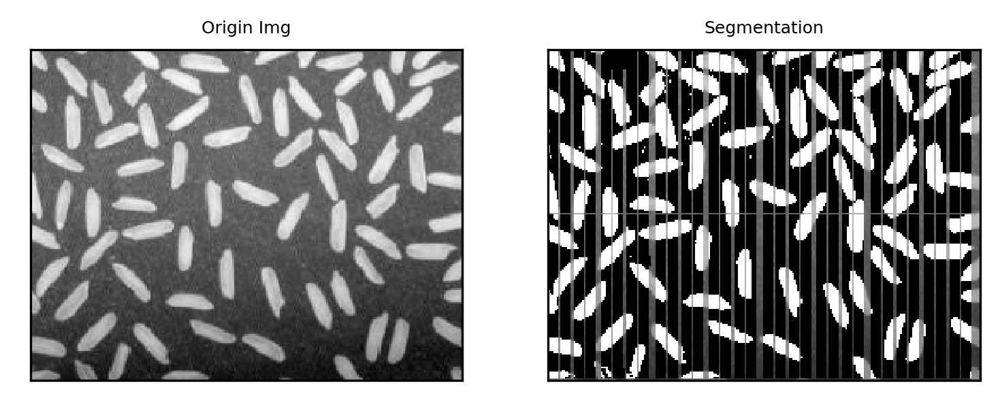

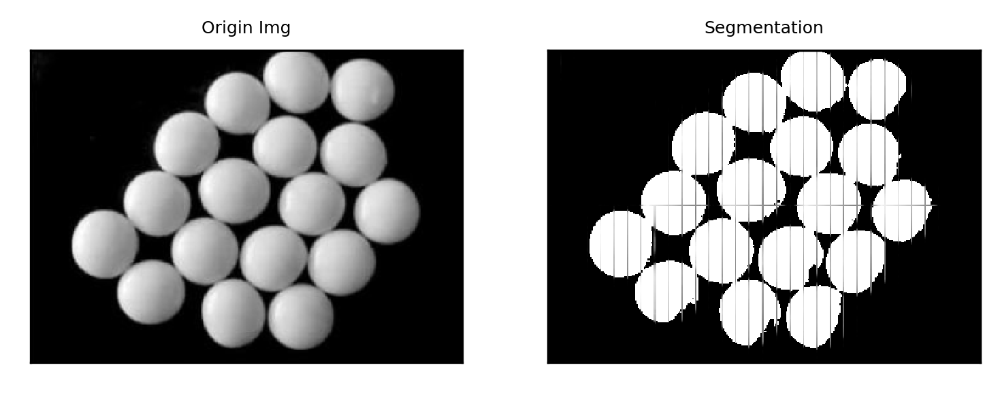

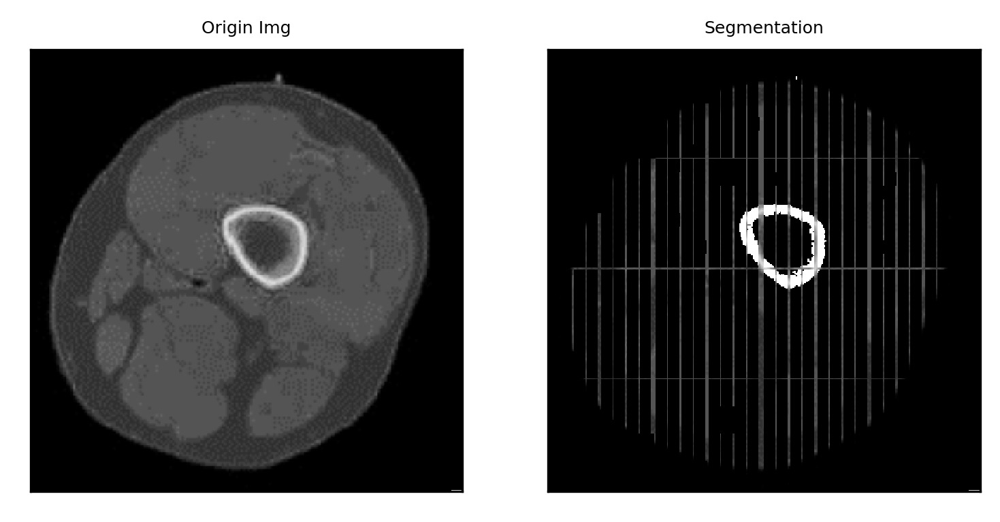

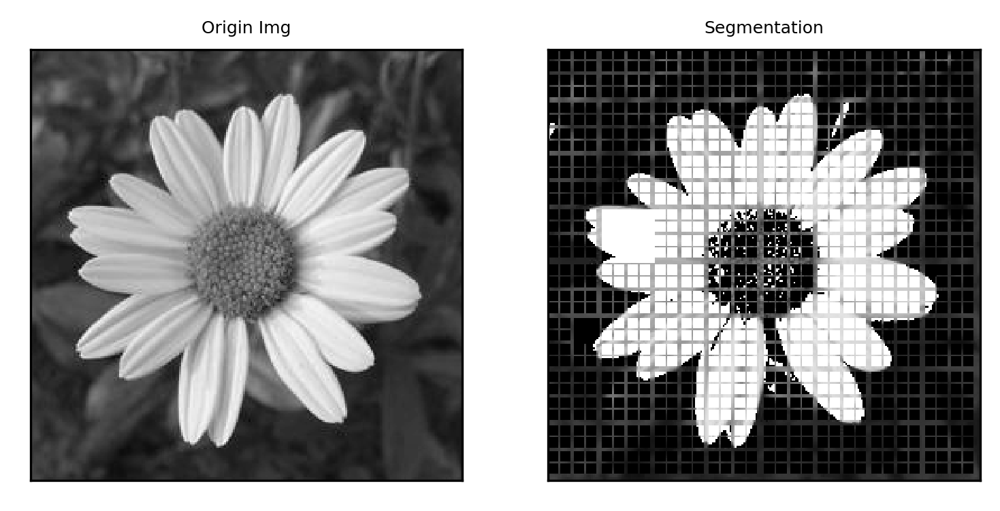

In [31]:
img_dirs = ['split_merge/complex1.jpg', 'split_merge/complex2.jpg', 'split_merge/complex3.bmp', 'split_merge/complex4.jpg', \
            'split_merge/simple1.bmp', 'split_merge/simple2.bmp', 'split_merge/simple4.bmp', 'split_merge/simple3.jpg']
for img_dir in img_dirs:
    img = cv2.imread(img_dir, 0)
    img_input = cv2.imread(img_dir, 0)#备份

    height, width = img.shape
    function(0, 0, width, height)
    plt.figure(dpi=300)
    plt.subplot(1, 2, 1)
    plt.imshow(img_input, cmap='gray')
    plt.title('Origin Img', fontsize='6')
    plt.xticks([]), plt.yticks([])
    plt.subplot(1, 2, 2)
    plt.imshow(img, cmap='gray')
    plt.title('Segmentation', fontsize='6')
    plt.xticks([]), plt.yticks([])
    plt.show()
